# Integrating data from different human MuSCs

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
from scipy import sparse
import collections
import matplotlib.pyplot as plt
import random
import scipy
from collections import Counter
import scipy.io
import bbknn

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, color_map='YlOrRd')
sc.logging.print_version_and_date()



Running Scanpy 1.9.1, on 2023-06-18 22:22.


***
Import data

In [2]:
# intercostal muscle
Sanger_adata = sc.read('/public/LiuTL/jupyter_notebook/skeletal_muscle/human_sanger_v2/write/human_SKM_sc_cellbender_v2.0_adata_bbknn_clean.h5ad')

In [9]:
Sanger_adata

AnnData object with n_obs × n_vars = 15788 × 33694
    obs: 'Sample_ID', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Mito_per', '10X_chemistry', 'Muscle', 'Source'
    var: 'GeneID', 'feature_types', 'genome', 'GeneName', 'n_counts', 'n_cells', 'human_gene'

In [10]:
# elife data
elife_adata = sc.read('./write/human_MuSC_elife_all_muscle_scvi_v1.0_adata.h5ad')

In [23]:
elife_adata

View of AnnData object with n_obs × n_vars = 39470 × 30316
    obs: 'Sample_ID', 'doublet_scores', 'predicted_doublets', 'Sex', 'Age_yo', 'Muscle', 'Age_bin', 'batch', 'Source', 'Species', '10X_chemistry', 'Mito_per'
    var: 'GeneName', 'mito'

In [24]:
# GSE143704 data
GSE_adata = sc.read('./write/human_MuSC_GSE143704_all_muscle_scvi_v1.0_adata.h5ad')

In [29]:
GSE_adata

View of AnnData object with n_obs × n_vars = 3124 × 21703
    obs: 'Sample_ID', 'annotation', '10X_chemistry', 'Muscle', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Source', 'Mito_per'
    var: 'GeneName'

In [30]:
# Tabula data
Tabula_adata = sc.read('./write/human_MuSC_Tabula_all_muscle_scvi_v1.0_adata.h5ad')

In [36]:
Tabula_adata

View of AnnData object with n_obs × n_vars = 4193 × 31437
    obs: 'Sample_ID', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Mito_per', 'annotation_old', '10X_chemistry', 'anatomical_information', 'Muscle', 'Source', 'n_genes', 'n_counts'
    var: 'mito', 'gene_ids', 'n_cells'

In [37]:
adata = elife_adata.concatenate(GSE_adata,Tabula_adata,Sanger_adata)

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [38]:
adata

AnnData object with n_obs × n_vars = 62575 × 15967
    obs: 'Sample_ID', 'doublet_scores', 'predicted_doublets', 'Sex', 'Age_yo', 'Muscle', 'Age_bin', 'batch', 'Source', 'Species', '10X_chemistry', 'Mito_per', 'annotation', 'annotation_old', 'anatomical_information', 'n_genes', 'n_counts'
    var: 'GeneName-0', 'mito-0', 'GeneName-1', 'mito-2', 'gene_ids-2', 'n_cells-2', 'GeneName-3', 'n_cells-3', 'GeneID-3', 'feature_types-3', 'genome-3', 'n_counts-3', 'human_gene-3'

In [39]:
adata.layers['counts'] = adata.X.copy()

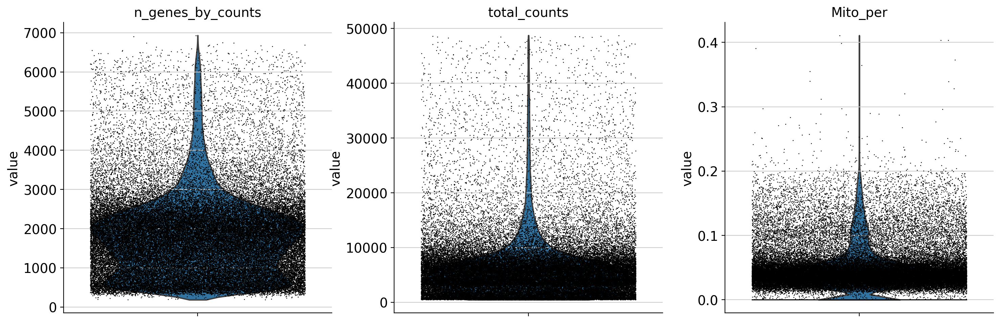

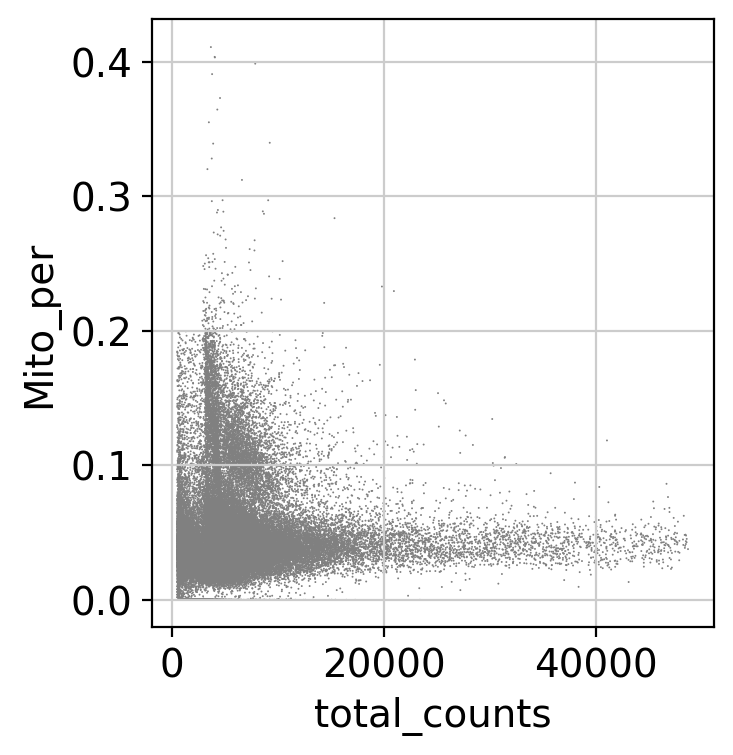

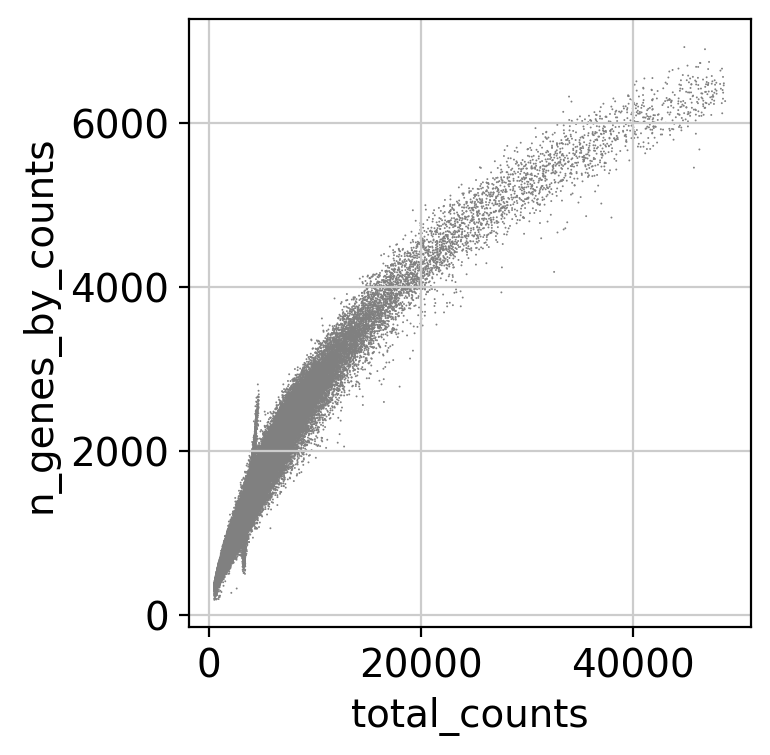

normalizing by total count per cell
    finished (0:00:03): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


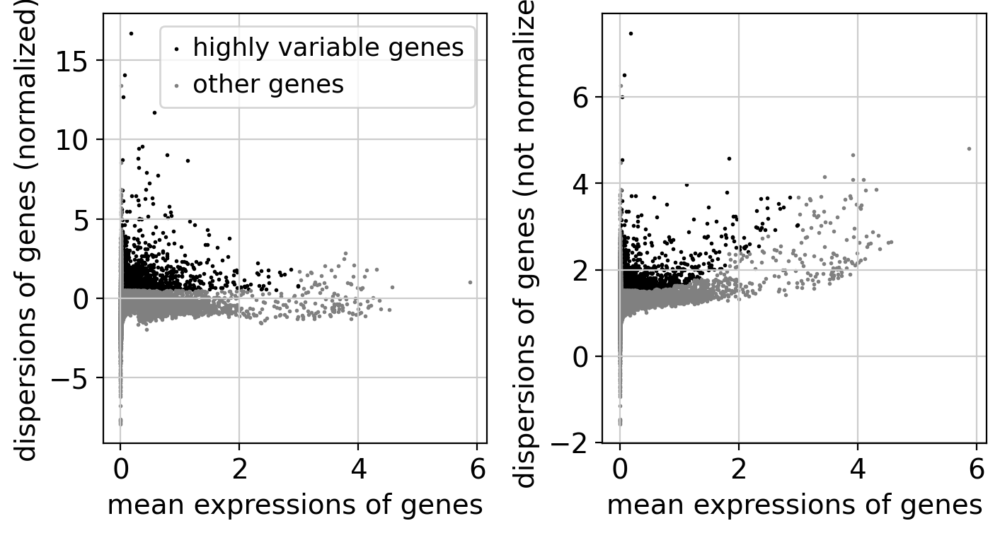

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.`
    on highly variable genes
    with n_comps=50
    finished (0:00:07)


/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


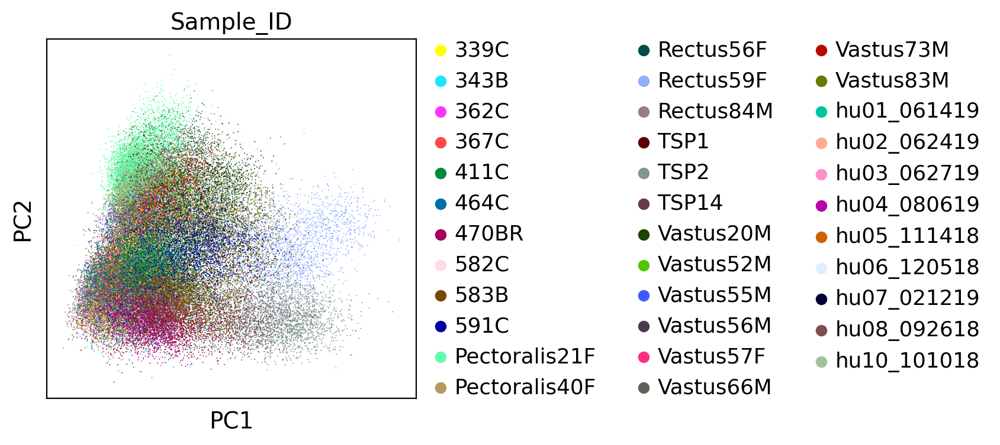

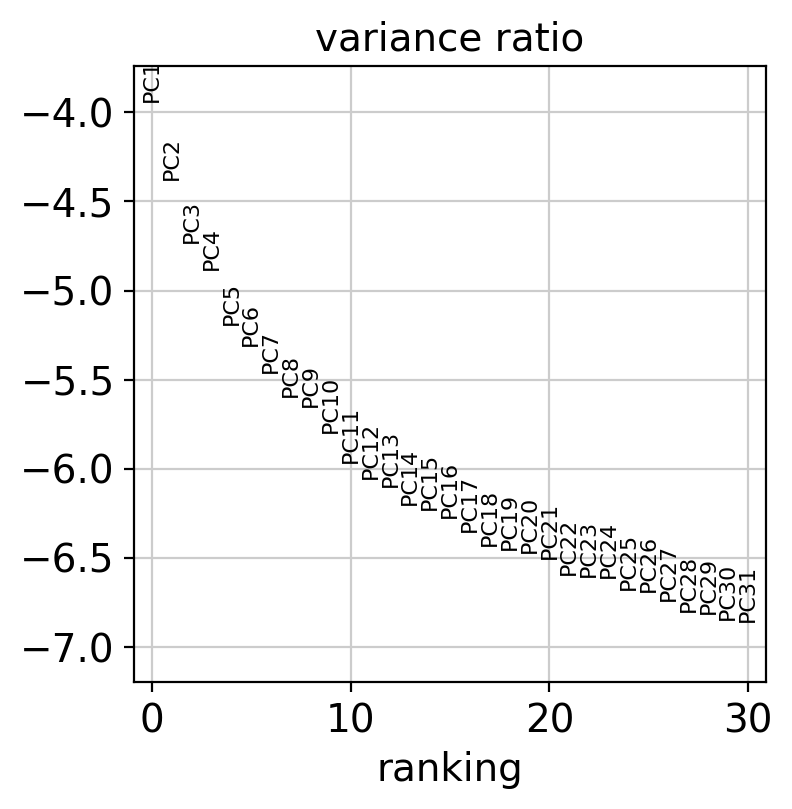

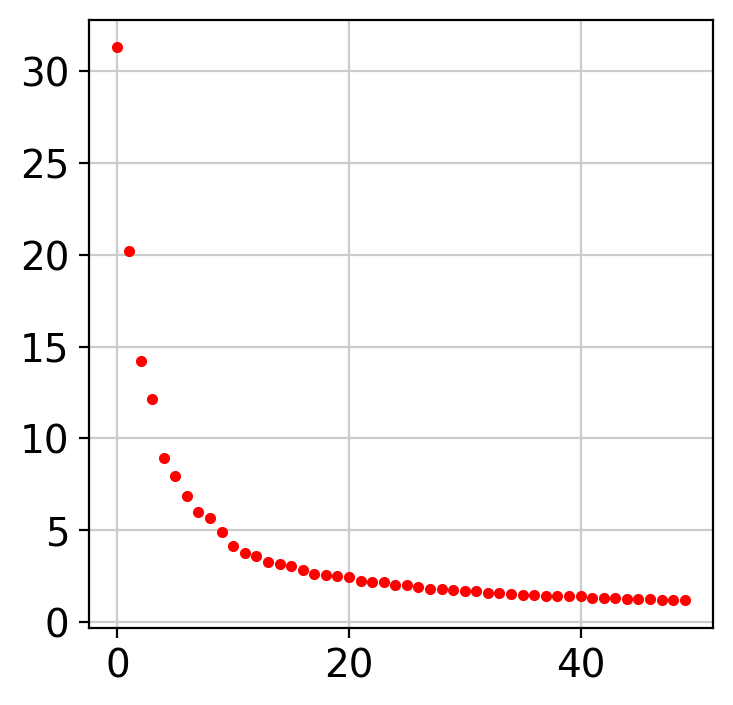

In [41]:
sc.pp.calculate_qc_metrics(adata, inplace=True)
sc.pl.violin(adata,['n_genes_by_counts','total_counts','Mito_per'],jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='Mito_per')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
sc.pp.normalize_per_cell(adata, counts_per_cell_after = 1e4)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata
adata = adata[:, adata.var['highly_variable']]
sc.pp.scale(adata, max_value=10)

sc.tl.pca(adata, svd_solver='auto')
sc.pl.pca(adata,color='Sample_ID')
sc.pl.pca_variance_ratio(adata, log=True)
plt.plot(adata.uns['pca']['variance'],'r.')

In [42]:
number_pcs = 30

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:56)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:27)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:40)


/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


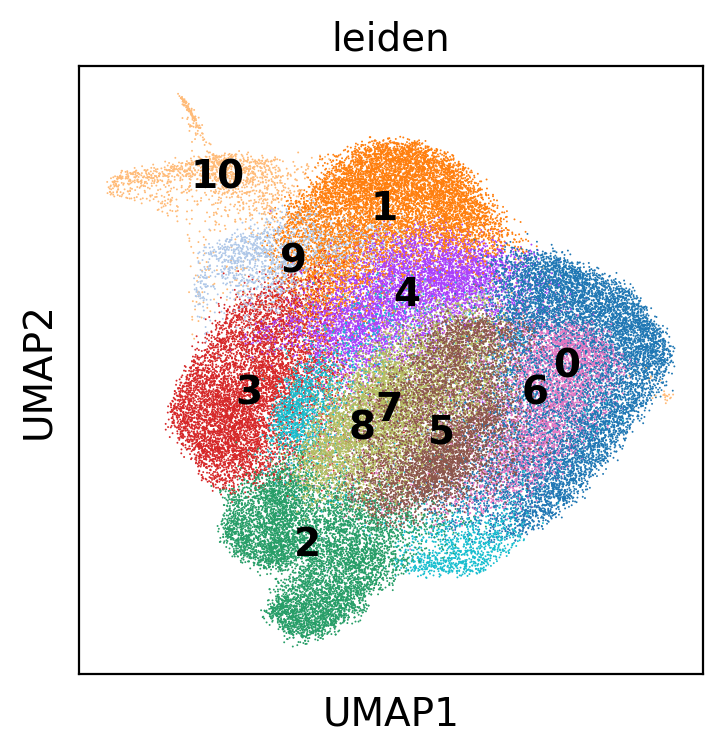

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


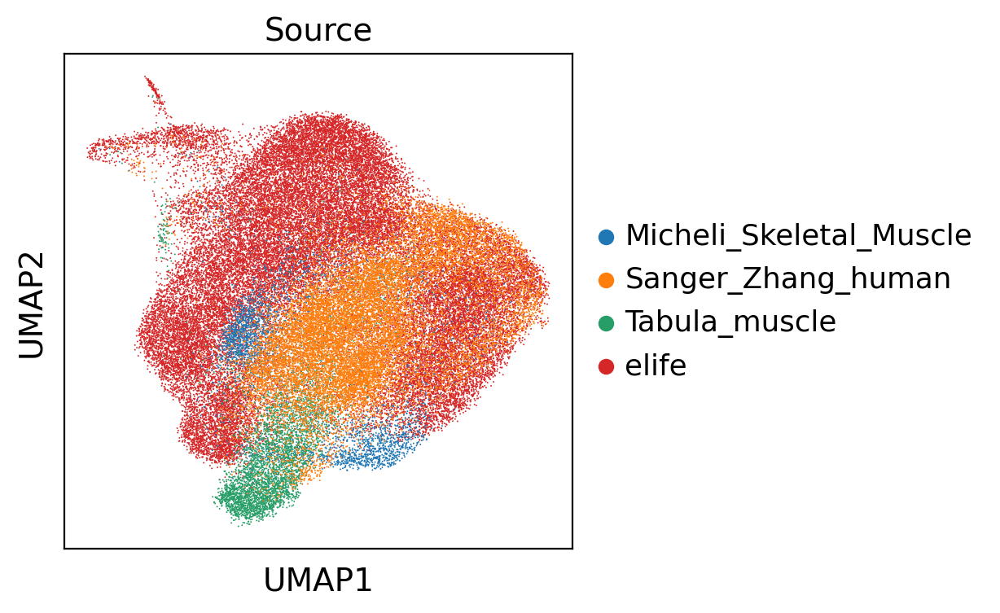

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


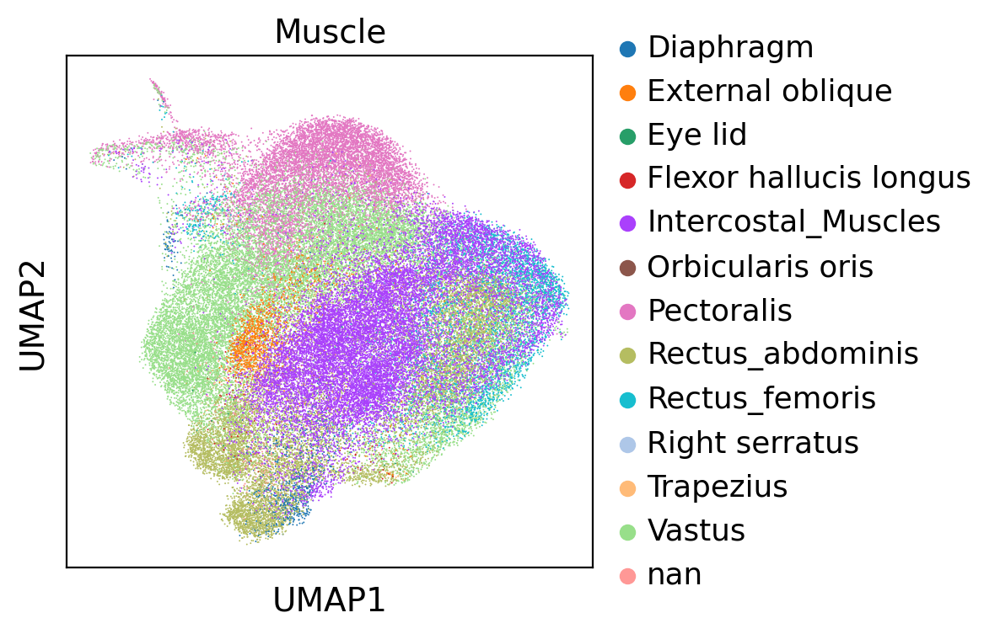

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


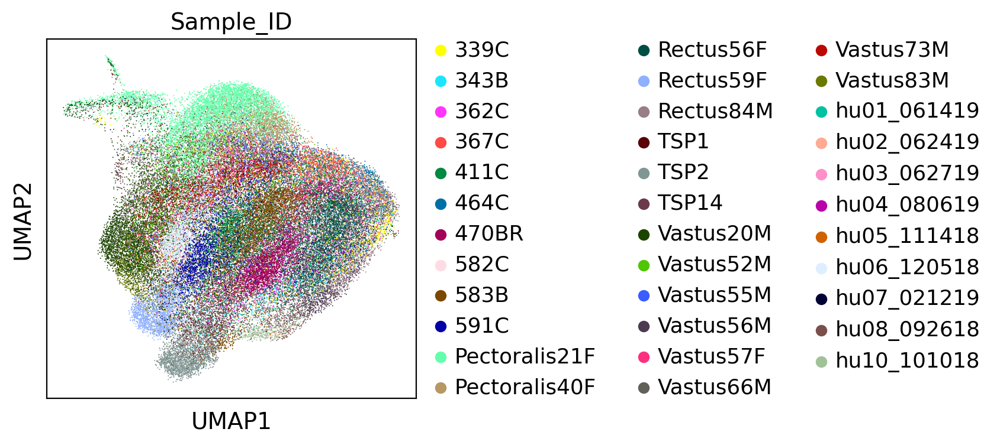

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


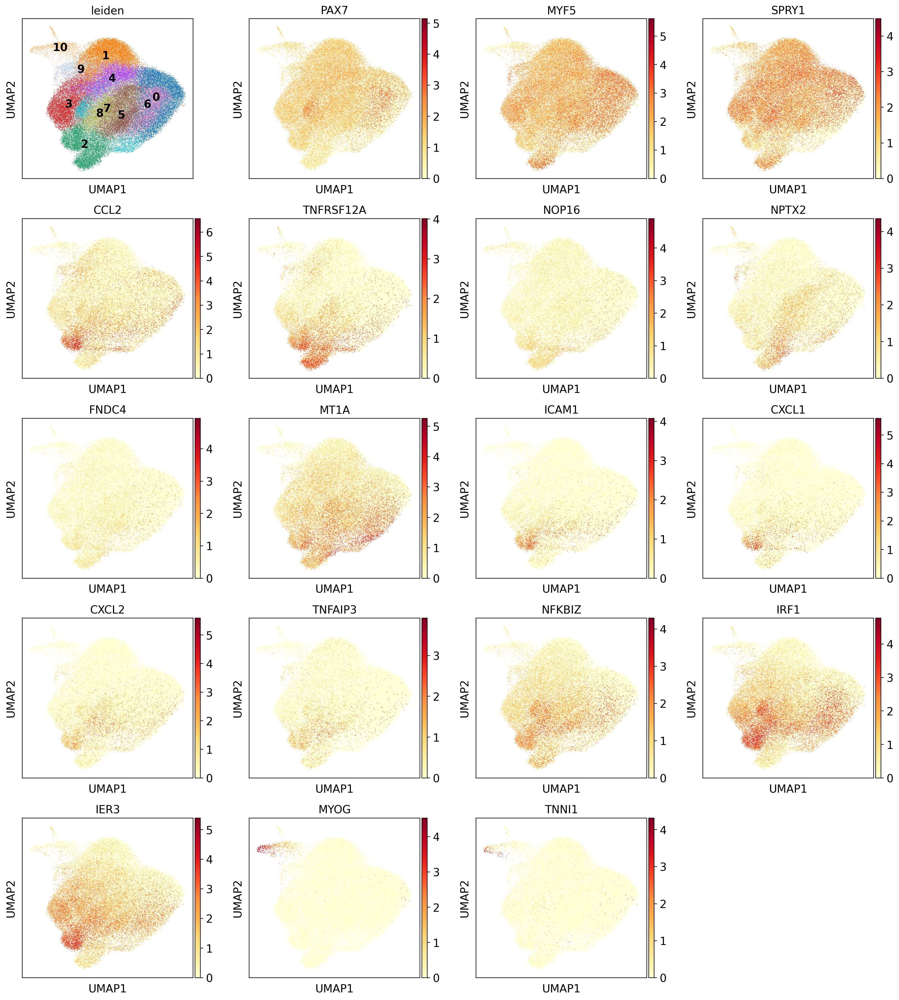

In [46]:
adata_bbknn_scale_v1 = bbknn.bbknn(adata,batch_key='Sample_ID',n_pcs=number_pcs,neighbors_within_batch=6,copy=True)
sc.tl.umap(adata_bbknn_scale_v1)
sc.tl.leiden(adata_bbknn_scale_v1,resolution=1)
sc.pl.umap(adata_bbknn_scale_v1, color=['leiden'],legend_loc='on data')
sc.pl.umap(adata_bbknn_scale_v1, color=['Source'])
sc.pl.umap(adata_bbknn_scale_v1, color=['Muscle'])
sc.pl.umap(adata_bbknn_scale_v1, color=['Sample_ID'])
sc.pl.umap(adata_bbknn_scale_v1, color=['leiden','PAX7','MYF5','SPRY1','CCL2','TNFRSF12A','NOP16','NPTX2','FNDC4','MT1A','ICAM1','CXCL1','CXCL2','TNFAIP3','NFKBIZ','IRF1','IER3','MYOG','TNNI1'],legend_loc='on data')

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


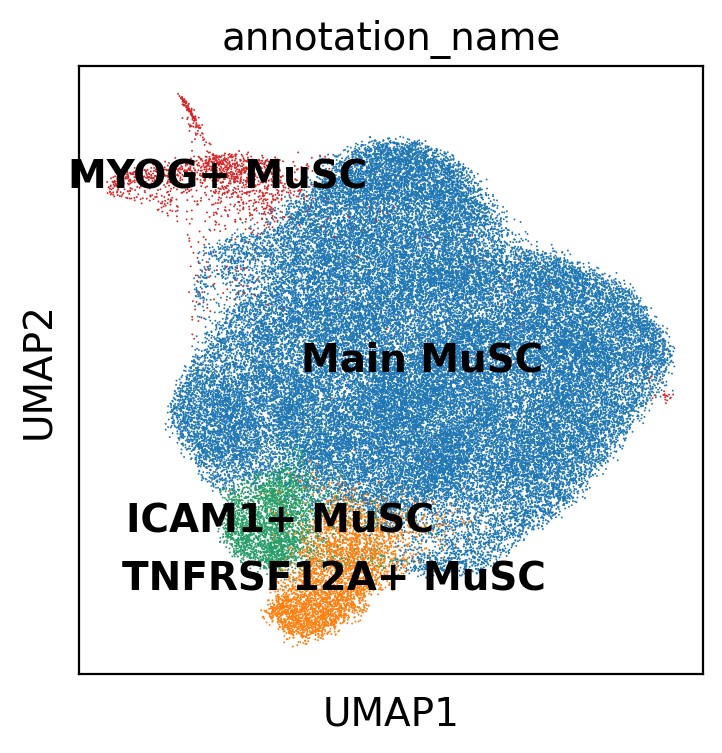

In [6]:
sc.pl.umap(adata_bbknn_scale_v1, color=['annotation_name'],legend_loc='on data')

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


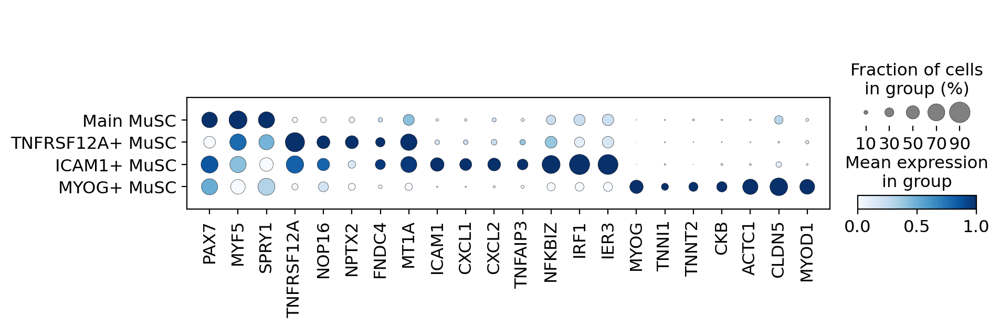

In [115]:
sc.pl.dotplot(adata_bbknn_scale_v1,['PAX7','MYF5','SPRY1','TNFRSF12A','NOP16','NPTX2','FNDC4','MT1A','ICAM1','CXCL1','CXCL2','TNFAIP3','NFKBIZ','IRF1','IER3','MYOG','TNNI1','TNNT2','CKB','ACTC1','CLDN5','MYOD1'],groupby='annotation_name',
              #categories_order=['Main-MuSCs','TNFRSF12A+MuSCs','CD54+MuSCs','MYOG+MuSCs',],
              cmap='Blues',
              standard_scale='var',
              save='human_MuSC_all_muscle_bbknn_v1.1_marker_blue1.pdf')